In [1]:
import pandas as pd
from sklearn.cluster import KMeans

import plotly.express as px

import time

import matplotlib.pyplot as plt
import seaborn as sns

# Setting up the data

In [2]:
WDI_GFDI_filled = pd.read_excel(r"C:\Users\klyukin\Documents\Python Scripts\phd\_code\research_paper\WDI_GFDI_filled.xlsx")

WDI_GFDI_china = WDI_GFDI_filled[WDI_GFDI_filled['Country Code'].isin(['CHN'])]
WDI_GFDI_china['Stocks traded, total value (current US$)'] = WDI_GFDI_china['Stocks traded, total value (current US$)'].interpolate(method='linear')
WDI_GFDI_not_china = WDI_GFDI_filled[~WDI_GFDI_filled['Country Code'].isin(['CHN'])]
WDI_GFDI_filled = pd.concat([WDI_GFDI_china, WDI_GFDI_not_china])

WDI_GFDI_filled['GDP per capita, PPP (constant 2021 international $) (annual growth rate %)'] = (WDI_GFDI_filled['GDP per capita, PPP (constant 2021 international $)'].div(WDI_GFDI_filled['GDP per capita, PPP (constant 2021 international $)'].shift(1))-1)*100

WDI_GFDI_filled['Value-traded ratio (%)'] = WDI_GFDI_filled['Stocks traded, total value (current US$)'] / WDI_GFDI_filled['GDP (current US$)'] * 100
WDI_GFDI_filled['Stock market turnover ratio (%)'] = WDI_GFDI_filled['Stocks traded, total value (current US$)'] / WDI_GFDI_filled['Market capitalization of listed domestic companies (current US$)'] * 100
WDI_GFDI_filled['Value-traded ratio to stock price volatility'] = WDI_GFDI_filled['Value-traded ratio (%)'] / WDI_GFDI_filled['Stock price volatility']
WDI_GFDI_filled['Market capitalization to GDP'] = WDI_GFDI_filled['Market capitalization of listed domestic companies (current US$)'] / WDI_GFDI_filled['GDP (current US$)'] * 100

WDI_GFDI_filled = WDI_GFDI_filled[WDI_GFDI_filled['Year'].between(1996, 2020)]

country_names = pd.read_excel(r"C:\Users\klyukin\Documents\Python Scripts\phd\_code\research_paper\research_countries.xlsx")
WDI_GFDI_filled = pd.merge(WDI_GFDI_filled, country_names, how='left', on='Country Code')
WDI_GFDI_filled = WDI_GFDI_filled[['Country Name', 'Country Code', 'Year', 'Bank deposits to GDP (%)',
                                   'Broad money (% of GDP)', 'Central bank assets to GDP (%)',
                                   'Domestic credit to private sector (% of GDP)',
                                   'Financial system deposits to GDP (%)', 'GDP (current LCU)',
                                   'GDP (current US$)', 'GDP per capita (current LCU)',
                                   'GDP per capita, PPP (constant 2021 international $)',
                                   'Market capitalization of listed domestic companies (current US$)',
                                   'Stock price volatility', 'Stocks traded, total value (current US$)',
                                   'GDP per capita, PPP (constant 2021 international $) (annual growth rate %)',
                                   'GDP, PPP (current international $)',
                                   'Value-traded ratio (%)', 'Stock market turnover ratio (%)',
                                   'Value-traded ratio to stock price volatility',
                                   'Market capitalization to GDP']]

# creating a weighted average funciton
def weighted_average(dataframe, value, weight):
    val = dataframe[value]
    wt = dataframe[weight]
    return (val * wt).sum() / wt.sum()

#K means Clustering algorothim function
def doKmeans(X, nclust):
    model = KMeans(nclust, max_iter=1000)
    model.fit(X)
    clust = model.predict(X)
    cent = model.cluster_centers_
    ss = model.inertia_
    features = model.n_features_in_
    return (clust, cent, ss)

C:\Users\klyukin\AppData\Local\Temp\ipykernel_8984\2968253827.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  WDI_GFDI_china['Stocks traded, total value (current US$)'] = WDI_GFDI_china['Stocks traded, total value (current US$)'].interpolate(method='linear')


# Stock market relative kmeans

In [ ]:
# year = 2020
stock_market_activity_df = pd.DataFrame()
stock_market_clusters_df = pd.DataFrame()

for year in WDI_GFDI_filled['Year'].drop_duplicates():

    # creating a one year df
    WDI_GFDI_year = WDI_GFDI_filled[WDI_GFDI_filled['Year'].isin([year])]
    
    # selecting the stock market activity indicators
    wh1 = WDI_GFDI_year[[
        'Stock price volatility',
        'Value-traded ratio (%)', 
        'Stock market turnover ratio (%)',
        'Market capitalization to GDP'
    ]]

    #calling the function and transforming clusters to a df
    clust, cent, ss = doKmeans(wh1, 7)
    kmeans = pd.DataFrame(clust)
    
    # attaching the kmeans clusters, years and country names
    wh1.insert(0,'GDP per capita, PPP (constant 2021 international $) (annual growth rate %)', WDI_GFDI_filled['GDP per capita, PPP (constant 2021 international $) (annual growth rate %)'])
    wh1.insert(0,'GDP, PPP (current international $)', WDI_GFDI_filled['GDP, PPP (current international $)'])
    
    wh1.insert(0,'kmeans', list(kmeans[0]))
    wh1.insert(0,'Year', WDI_GFDI_filled['Year'])
    wh1.insert(0,'Country', WDI_GFDI_filled['Country Name'])
    wh1 = wh1.sort_values(by=['Year'])
    
    # creating and sorting the cluster centroids to provie 
    clusters_df = pd.DataFrame(cent, columns = wh1.columns[5:])
    
    
    clusters_df.insert(0
                       ,'GDP per capita, PPP (constant 2021 international $) (weighted annual growth rate %)'
                       , wh1[['kmeans','GDP per capita, PPP (constant 2021 international $) (annual growth rate %)', 'GDP, PPP (current international $)']].groupby('kmeans').apply(weighted_average
                                                                                                                                                      , 'GDP per capita, PPP (constant 2021 international $) (annual growth rate %)' # 'value'
                                                                                                                                                      , 'GDP, PPP (current international $)' # 'weight'
                                                                                                                                                     ).values)
    
    clusters_df = clusters_df.sort_values(by=['GDP per capita, PPP (constant 2021 international $) (weighted annual growth rate %)'], ascending=False).reset_index(drop=False)
    cluster_names = ['Ultra high GDP per capita PPP annual growth'
                     , 'High GDP per capita PPP annual growth'
                     , 'Medium-high GDP per capita PPP annual growth'
                     , 'Medium GDP per capita PPP annual growth'
                     , 'Medium-low GDP per capita PPP annual growth'
                     , 'Low GDP per capita PPP annual growth'
                     , 'Ultra low GDP per capita PPP annual growth']
    
    clusters_df.insert(1,'Year', year)
    clusters_df.insert(1,'Сluster names', cluster_names)
    clusters_df.rename(columns={'index': 'kmeans'}, inplace=True)
    clusters_df = clusters_df.reset_index(drop=False)
    clusters_df.insert(1,'Sum of squared distances', ss)
    
    stock_market_clusters_df = pd.concat([stock_market_clusters_df, clusters_df])
    
    cluster_names = clusters_df[['kmeans','index','Сluster names']]
    
    wh1.insert(1,'Sum of squared distances', ss)
    wh1 = pd.merge(wh1, cluster_names, how='left', on='kmeans')
    wh1 = wh1.sort_values(by=['index'], ascending=True)
    
    stock_market_activity_df = pd.concat([stock_market_activity_df, wh1])

In [ ]:
for year in stock_market_activity_df['Year'].drop_duplicates():

    # creating a one year df
    wh1 = stock_market_activity_df[stock_market_activity_df['Year'].isin([year])]
    
    # Map discrete categories to colors  
    color_map = {
        'Ultra high GDP per capita PPP annual growth': "lime"
        , 'High GDP per capita PPP annual growth': "greenyellow"
        , 'Medium-high GDP per capita PPP annual growth': "yellowgreen"
        , 'Medium GDP per capita PPP annual growth': "gold"
        , 'Medium-low GDP per capita PPP annual growth': "goldenrod"
        , 'Low GDP per capita PPP annual growth': "orangered"
        , 'Ultra low GDP per capita PPP annual growth': "darkred"
    }
    
    # Create a choropleth map
    fig = px.choropleth(
        wh1,
        locations='Country',  # Column with locations
        locationmode='country names',  # Use country names
        color='Сluster names',  # Column with categories for colors
        color_discrete_map=color_map,  # Use your defined color map
        projection = 'winkel tripel',
        # scope='asia',
        width=1400,  # Set desired width (in pixels)
        height=800   # Set desired height (in pixels)
    )
    
    fig.update_layout(title=dict(text=f'''Stock market activity and GDP per capita PPP annual growth in {year}''', font=dict(size=24)))
    
    # # Show figure
    fig.show()

In [ ]:
stock_market_clusters_df.to_excel(r"stock_market_realtive_clusters_df.xlsx", index=False)

stock_market_activity_df.to_excel(r"stock_market_realtive_activity_df.xlsx", index=False)

# Banking activity relative kmeans

In [ ]:
# year = 2020
banking_activity_df = pd.DataFrame()
banking_activity_clusters_df = pd.DataFrame()

for year in WDI_GFDI_filled['Year'].drop_duplicates():

    # creating a one year df
    WDI_GFDI_year = WDI_GFDI_filled[WDI_GFDI_filled['Year'].isin([year])]
    
    # selecting the stock market activity indicators
    wh1 = WDI_GFDI_year[[
        'Bank deposits to GDP (%)', 
        'Broad money (% of GDP)',
        'Central bank assets to GDP (%)',
        'Domestic credit to private sector (% of GDP)'
    ]]

    #calling the function and transforming clusters to a df
    clust, cent, ss = doKmeans(wh1, 7)
    kmeans = pd.DataFrame(clust)
    
    # attaching the kmeans clusters, years and country names
    wh1.insert(0,'GDP per capita, PPP (constant 2021 international $) (annual growth rate %)', WDI_GFDI_filled['GDP per capita, PPP (constant 2021 international $) (annual growth rate %)'])
    wh1.insert(0,'GDP, PPP (current international $)', WDI_GFDI_filled['GDP, PPP (current international $)'])
    
    wh1.insert(0,'kmeans', list(kmeans[0]))
    wh1.insert(0,'Year', WDI_GFDI_filled['Year'])
    wh1.insert(0,'Country', WDI_GFDI_filled['Country Name'])
    wh1 = wh1.sort_values(by=['Year'])
    
    # creating and sorting the cluster centroids to provie 
    clusters_df = pd.DataFrame(cent, columns = wh1.columns[5:])
    
    
    clusters_df.insert(0
                       ,'GDP per capita, PPP (constant 2021 international $) (weighted annual growth rate %)'
                       , wh1[['kmeans','GDP per capita, PPP (constant 2021 international $) (annual growth rate %)', 'GDP, PPP (current international $)']].groupby('kmeans').apply(weighted_average
                                                                                                                                                      , 'GDP per capita, PPP (constant 2021 international $) (annual growth rate %)' # 'value'
                                                                                                                                                      , 'GDP, PPP (current international $)' # 'weight'
                                                                                                                                                     ).values)
    
    clusters_df = clusters_df.sort_values(by=['GDP per capita, PPP (constant 2021 international $) (weighted annual growth rate %)'], ascending=False).reset_index(drop=False)
    cluster_names = ['Ultra high GDP per capita PPP annual growth'
                     , 'High GDP per capita PPP annual growth'
                     , 'Medium-high GDP per capita PPP annual growth'
                     , 'Medium GDP per capita PPP annual growth'
                     , 'Medium-low GDP per capita PPP annual growth'
                     , 'Low GDP per capita PPP annual growth'
                     , 'Ultra low GDP per capita PPP annual growth']
    
    clusters_df.insert(1,'Year', year)
    clusters_df.insert(1,'Сluster names', cluster_names)
    clusters_df.rename(columns={'index': 'kmeans'}, inplace=True)
    clusters_df = clusters_df.reset_index(drop=False)
    clusters_df.insert(1,'Sum of squared distances', ss)
    
    banking_activity_clusters_df = pd.concat([banking_activity_clusters_df, clusters_df])
    
    cluster_names = clusters_df[['kmeans','index','Сluster names']]
    
    wh1.insert(1,'Sum of squared distances', ss)
    wh1 = pd.merge(wh1, cluster_names, how='left', on='kmeans')
    wh1 = wh1.sort_values(by=['index'], ascending=True)
    
    banking_activity_df = pd.concat([banking_activity_df, wh1])

In [ ]:
for year in banking_activity_df['Year'].drop_duplicates():

    # creating a one year df
    wh1 = banking_activity_df[banking_activity_df['Year'].isin([year])]
    
    # Map discrete categories to colors  
    color_map = {
        'Ultra high GDP per capita PPP annual growth': "lime"
        , 'High GDP per capita PPP annual growth': "greenyellow"
        , 'Medium-high GDP per capita PPP annual growth': "yellowgreen"
        , 'Medium GDP per capita PPP annual growth': "gold"
        , 'Medium-low GDP per capita PPP annual growth': "goldenrod"
        , 'Low GDP per capita PPP annual growth': "orangered"
        , 'Ultra low GDP per capita PPP annual growth': "darkred"
    }
    
    # Create a choropleth map
    fig = px.choropleth(
        wh1,
        locations='Country',  # Column with locations
        locationmode='country names',  # Use country names
        color='Сluster names',  # Column with categories for colors
        color_discrete_map=color_map,  # Use your defined color map
        projection = 'winkel tripel',
        # scope='asia',
        width=1400,  # Set desired width (in pixels)
        height=800   # Set desired height (in pixels)
    )

    fig.update_layout(title=dict(text=f'Banking sector size and GDP per capita PPP annual growth in {year}', font=dict(size=24)))

    # Show figure
    fig.show()

In [ ]:
banking_activity_clusters_df.to_excel(r"banking_realtive_activity_clusters_df.xlsx", index=False)

banking_activity_df.to_excel(r"banking_realtive_activity_df.xlsx", index=False)

# Financail development relative kmeans

In [3]:
# year = 2020
financail_development_df = pd.DataFrame()
financail_development_clusters_df = pd.DataFrame()

for year in WDI_GFDI_filled['Year'].drop_duplicates():

    # creating a one year df
    WDI_GFDI_year = WDI_GFDI_filled[WDI_GFDI_filled['Year'].isin([year])]
    
    # selecting the stock market activity indicators
    wh1 = WDI_GFDI_year[[
        'Stock price volatility'
        , 'Value-traded ratio (%)'
        , 'Stock market turnover ratio (%)'
        , 'Market capitalization to GDP'
        , 'Bank deposits to GDP (%)'
        , 'Broad money (% of GDP)'
        , 'Central bank assets to GDP (%)'
        , 'Domestic credit to private sector (% of GDP)'
    ]]


    #calling the function and transforming clusters to a df
    clust, cent, ss = doKmeans(wh1, 7)
    kmeans = pd.DataFrame(clust)
    
    # attaching the kmeans clusters, years and country names
    wh1.insert(0,'GDP per capita, PPP (constant 2021 international $) (annual growth rate %)', WDI_GFDI_filled['GDP per capita, PPP (constant 2021 international $) (annual growth rate %)'])
    wh1.insert(0,'GDP, PPP (current international $)', WDI_GFDI_filled['GDP, PPP (current international $)'])
    
    wh1.insert(0,'kmeans', list(kmeans[0]))
    wh1.insert(0,'Year', WDI_GFDI_filled['Year'])
    wh1.insert(0,'Country', WDI_GFDI_filled['Country Name'])
    wh1 = wh1.sort_values(by=['Year'])
    
    # creating and sorting the cluster centroids to provie 
    clusters_df = pd.DataFrame(cent, columns = wh1.columns[5:])
    
    
    clusters_df.insert(0
                       ,'GDP per capita, PPP (constant 2021 international $) (weighted annual growth rate %)'
                       , wh1[['kmeans','GDP per capita, PPP (constant 2021 international $) (annual growth rate %)', 'GDP, PPP (current international $)']].groupby('kmeans').apply(weighted_average
                                                                                                                                                      , 'GDP per capita, PPP (constant 2021 international $) (annual growth rate %)' # 'value'
                                                                                                                                                      , 'GDP, PPP (current international $)' # 'weight'
                                                                                                                                                     ).values)
    
    clusters_df = clusters_df.sort_values(by=['GDP per capita, PPP (constant 2021 international $) (weighted annual growth rate %)'], ascending=False).reset_index(drop=False)
    cluster_names = ['Ultra high GDP per capita PPP annual growth'
                     , 'High GDP per capita PPP annual growth'
                     , 'Medium-high GDP per capita PPP annual growth'
                     , 'Medium GDP per capita PPP annual growth'
                     , 'Medium-low GDP per capita PPP annual growth'
                     , 'Low GDP per capita PPP annual growth'
                     , 'Ultra low GDP per capita PPP annual growth']
    
    clusters_df.insert(1,'Year', year)
    clusters_df.insert(1,'Сluster names', cluster_names)
    clusters_df.rename(columns={'index': 'kmeans'}, inplace=True)
    clusters_df = clusters_df.reset_index(drop=False)
    clusters_df.insert(1,'Sum of squared distances', ss)
    
    financail_development_clusters_df = pd.concat([financail_development_clusters_df, clusters_df])
    
    cluster_names = clusters_df[['kmeans','index','Сluster names']]
    
    wh1.insert(1,'Sum of squared distances', ss)
    wh1 = pd.merge(wh1, cluster_names, how='left', on='kmeans')
    wh1 = wh1.sort_values(by=['index'], ascending=True)
    
    financail_development_df = pd.concat([financail_development_df, wh1])

C:\Users\klyukin\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\klyukin\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\klyukin\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\klyukin\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks t

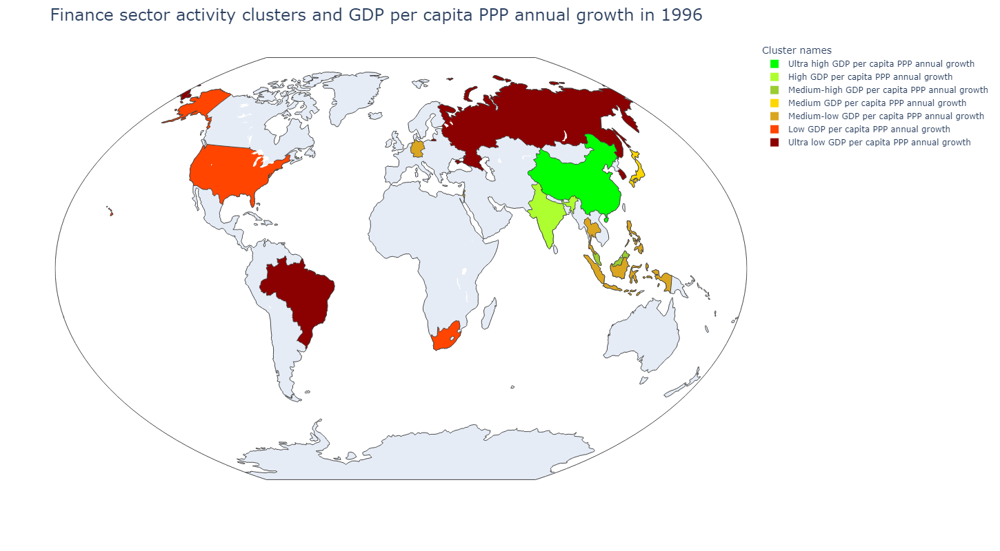

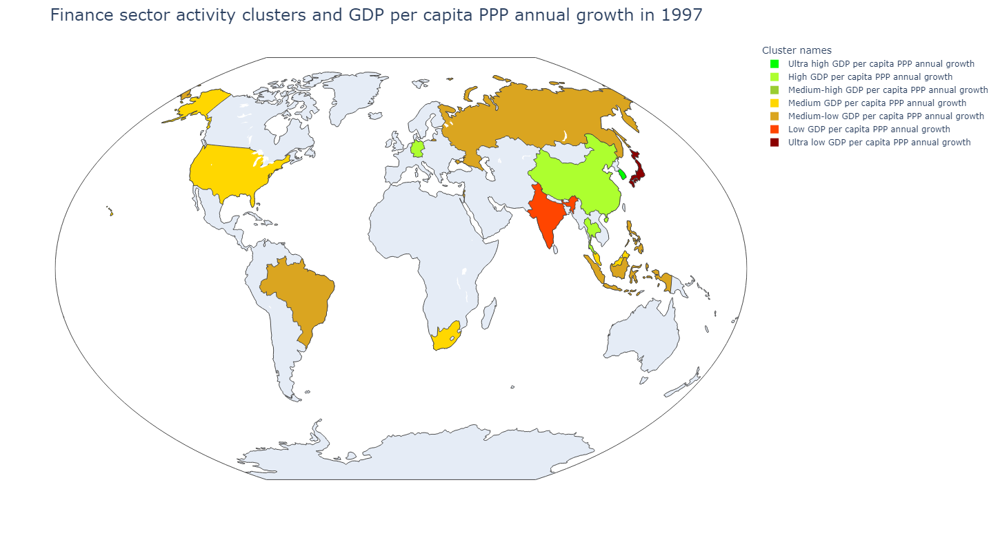

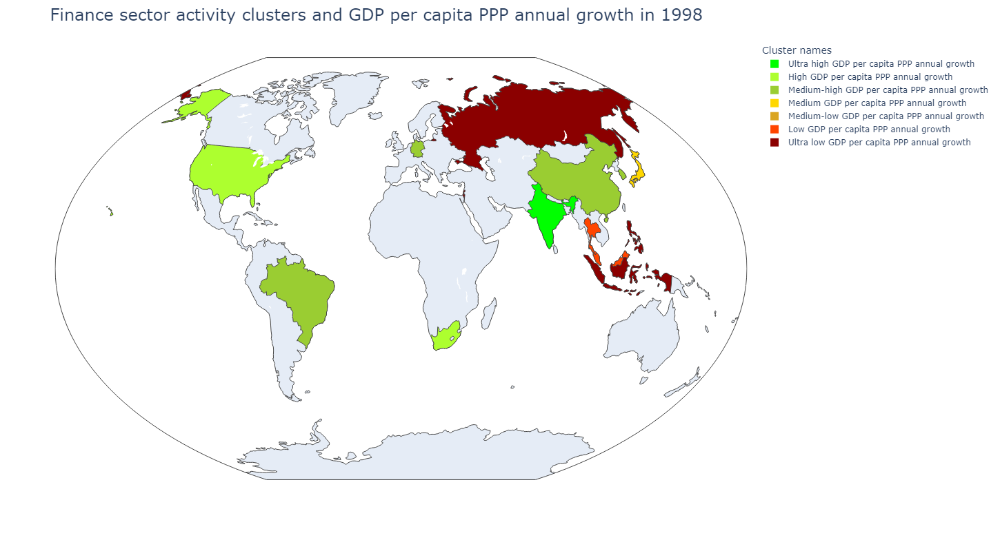

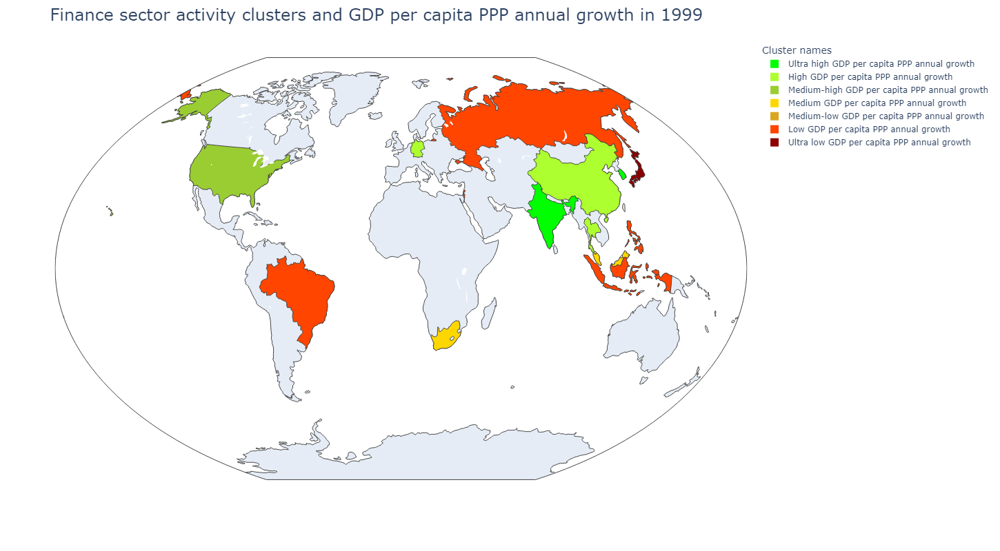

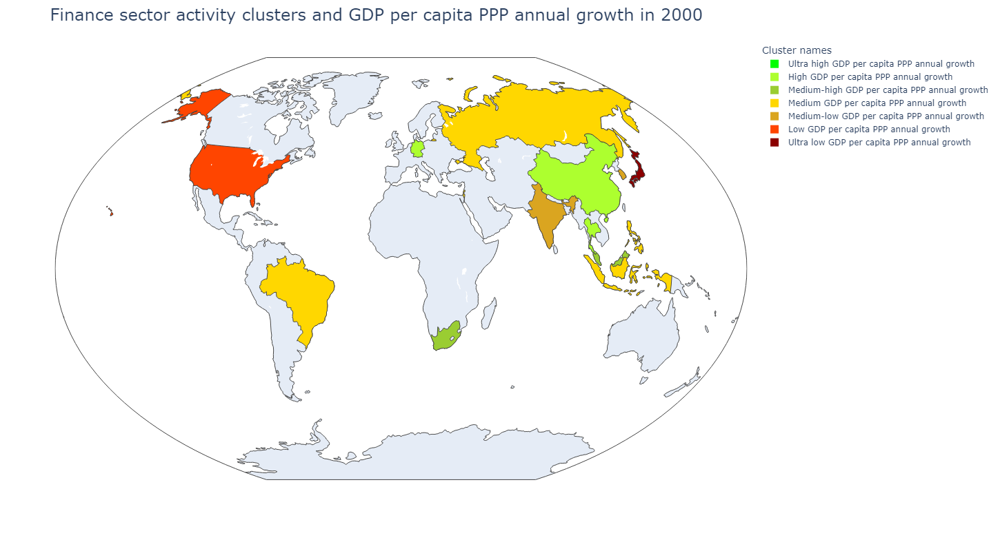

...

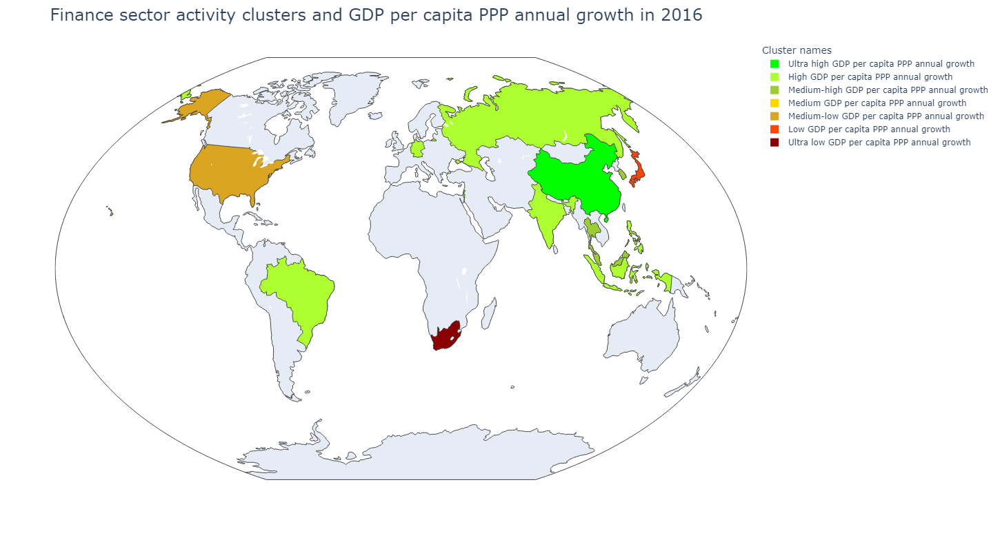

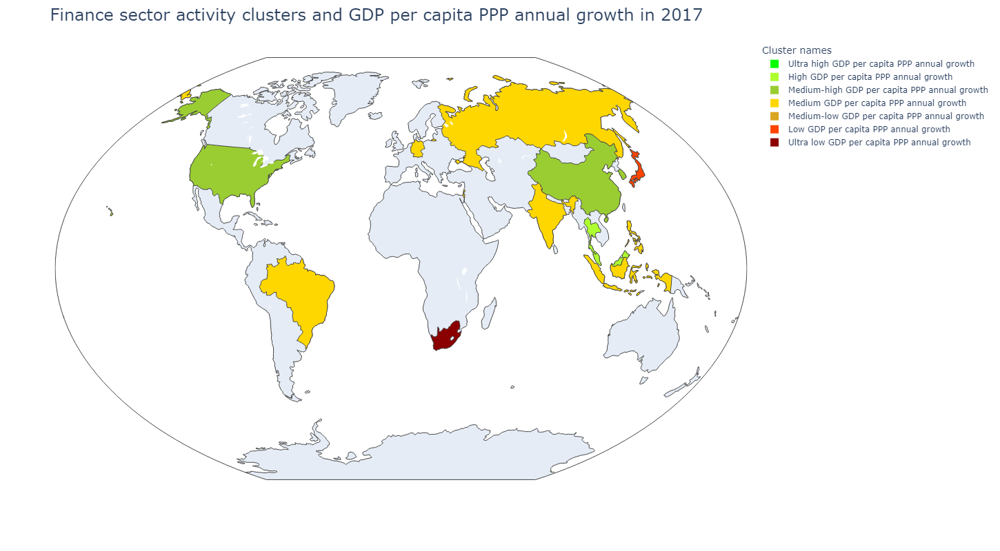

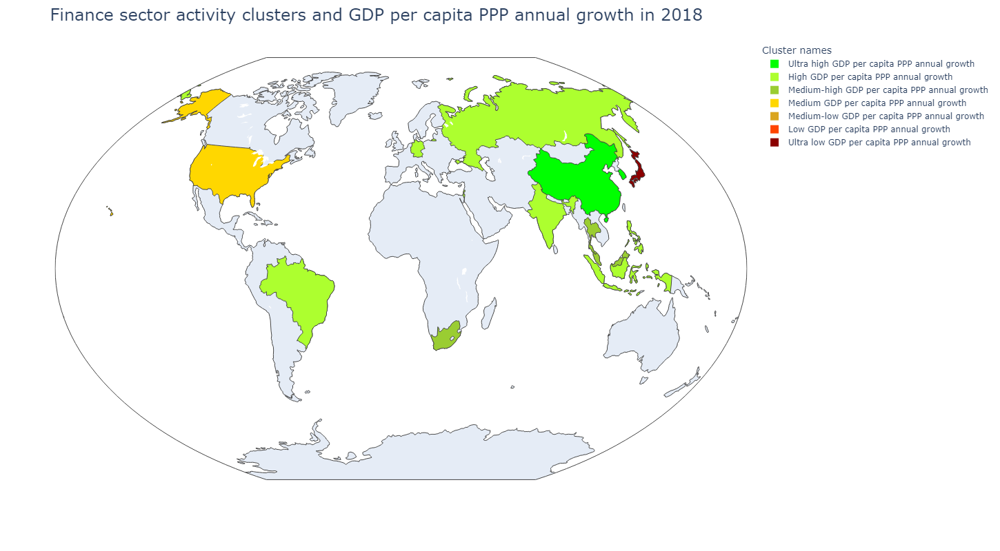

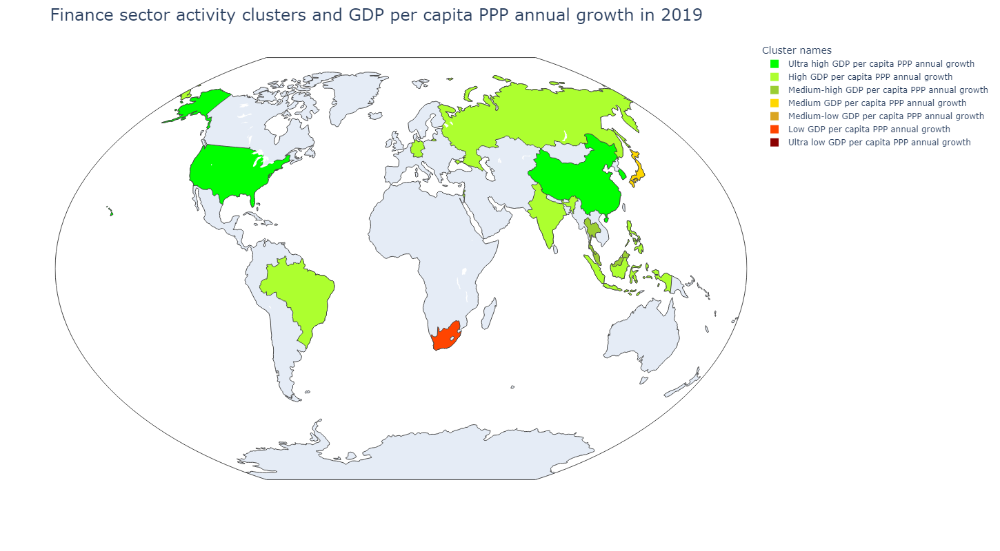

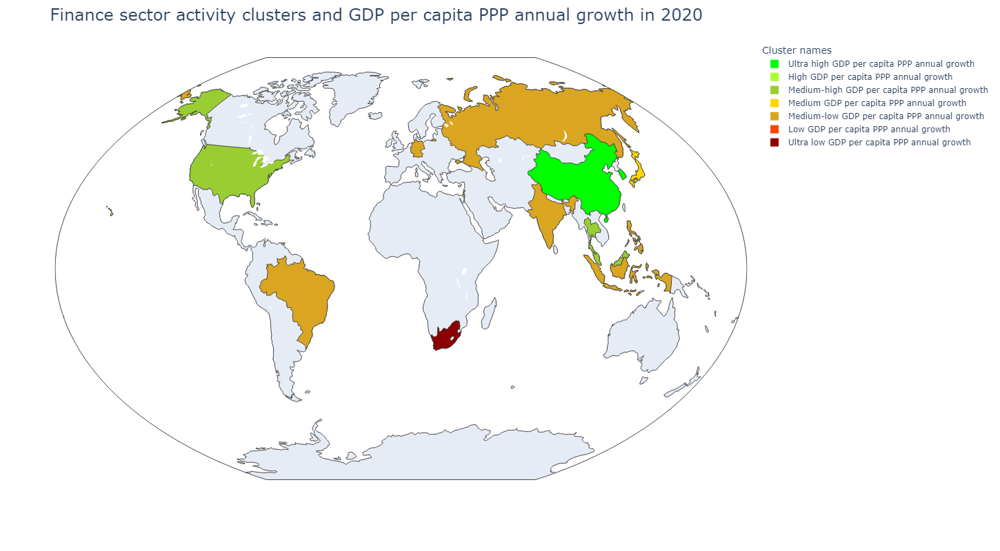

In [4]:
for year in financail_development_df['Year'].drop_duplicates():

    # creating a one year df
    wh1 = financail_development_df[financail_development_df['Year'].isin([year])]
    
    # Map discrete categories to colors  
    color_map = {
        'Ultra high GDP per capita PPP annual growth': "lime"
        , 'High GDP per capita PPP annual growth': "greenyellow"
        , 'Medium-high GDP per capita PPP annual growth': "yellowgreen"
        , 'Medium GDP per capita PPP annual growth': "gold"
        , 'Medium-low GDP per capita PPP annual growth': "goldenrod"
        , 'Low GDP per capita PPP annual growth': "orangered"
        , 'Ultra low GDP per capita PPP annual growth': "darkred"
    }
    
    # Create a choropleth map
    fig = px.choropleth(
        wh1,
        locations='Country',  # Column with locations
        locationmode='country names',  # Use country names
        color='Сluster names',  # Column with categories for colors
        color_discrete_map=color_map,  # Use your defined color map
        projection = 'winkel tripel',
        # scope='asia',
        width=1400,  # Set desired width (in pixels)
        height=800   # Set desired height (in pixels)
    )

    fig.update_layout(title=dict(text=f'Finance sector activity clusters and GDP per capita PPP annual growth in {year}', font=dict(size=24)))
    
    # Show figure
    fig.show()

In [5]:
financail_development_clusters_df.to_excel(r"financail_realtive_development_clusters_df.xlsx", index=False)

financail_development_df.to_excel(r"financail_realtive_development_df.xlsx", index=False)

# Movement of relative financial development cluster centroids

In [6]:
test_clusters_df = financail_development_clusters_df[['Сluster names', 'Year',
                                   'GDP per capita, PPP (constant 2021 international $) (weighted annual growth rate %)',
                                   'Value-traded ratio (%)',
                                   'Domestic credit to private sector (% of GDP)']]

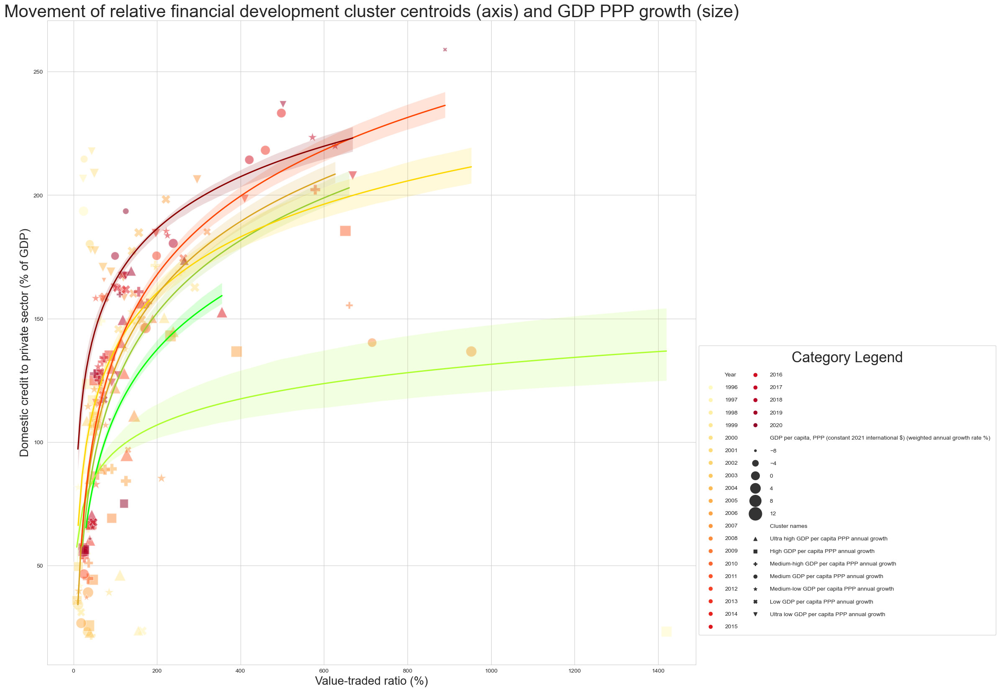

In [7]:
##### # Set the style
sns.set_style("whitegrid")


plt.figure(figsize=(20, 20))

palette = sns.color_palette("YlOrRd", n_colors=len(test_clusters_df['Year'].unique()))

# Define the marker styles for each category to be used in style
style_dict = {
        'Ultra high GDP per capita PPP annual growth': "^"
        , 'High GDP per capita PPP annual growth': "s"
        , 'Medium-high GDP per capita PPP annual growth': "P"
        , 'Medium GDP per capita PPP annual growth': "o"
        , 'Medium-low GDP per capita PPP annual growth': "*"
        , 'Low GDP per capita PPP annual growth': "X"
        , 'Ultra low GDP per capita PPP annual growth': "v"
    }

# Scatter plot with color, shape, and size mapping and transparency
sns.scatterplot(data=test_clusters_df
                , x='Value-traded ratio (%)'
                , y='Domestic credit to private sector (% of GDP)'
                , hue='Year'
                , style='Сluster names'
                , palette=palette # Custom color palette
                , markers=style_dict # Custom markers for categories
                , size='GDP per capita, PPP (constant 2021 international $) (weighted annual growth rate %)'
                , sizes=(1, 500)
                , alpha=0.5
               ) 




color_dict = {
        'Ultra high GDP per capita PPP annual growth': "lime"
        , 'High GDP per capita PPP annual growth': "greenyellow"
        , 'Medium-high GDP per capita PPP annual growth': "yellowgreen"
        , 'Medium GDP per capita PPP annual growth': "gold"
        , 'Medium-low GDP per capita PPP annual growth': "goldenrod"
        , 'Low GDP per capita PPP annual growth': "orangered"
        , 'Ultra low GDP per capita PPP annual growth': "darkred"
    }

for cluster_names in test_clusters_df['Сluster names'].drop_duplicates():
    sns.regplot(data=test_clusters_df[test_clusters_df['Сluster names'].isin([cluster_names])]
                , x='Value-traded ratio (%)'
                , y='Domestic credit to private sector (% of GDP)'
                , ci=25
                , scatter=False
                , line_kws={'color':color_dict[cluster_names]}
                # , marker=style_dict[cluster_names]
                , logx=True
               )




# Add title and labels
plt.title('Movement of relative financial development cluster centroids (axis) and GDP PPP growth (size)'
          , fontdict = {'fontsize' : 30}
         )
plt.xlabel('Value-traded ratio (%)'
          , fontdict = {'fontsize' : 20}
         )
plt.ylabel('Domestic credit to private sector (% of GDP)'
          , fontdict = {'fontsize' : 20}
         )
plt.legend(title='Category Legend'
           , ncols = 2
           , handletextpad=1.5
           , labelspacing=1.25
           , title_fontsize=25
           , borderpad=1
           , fontsize=10
           # , loc="upper left"
           , bbox_to_anchor=(1,0.5)
          )
# plt.legend()

plt.show()

# YlOrRd
# summer